# The Sparks Foundation Internship
### Name: Jeet Maheshbhai Joshi
### Domain: IOT & Computer Vision

## Task 4 :- Detection of face mask

#### Step 1:- Importing all the required Modules........

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from tensorflow.keras import layers
from tensorflow.keras import Model
from os import getcwd
from tensorflow.keras.applications.inception_v3 import InceptionV3
import cv2

#### Step 2:- Preparing Inception model for Tansfer Learning....................

In [2]:
model = InceptionV3(input_shape = (150,150,3),include_top = False, weights = None)
model.load_weights('inception_weights.h5')

for layer in model.layers:
    layer.trainable = False


model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 74, 74, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 74, 74, 32)   0           batch_normalization[0][0]        
_______________________________________________________________________________________

####  Step 3:- Adding Layers for training and Compilation..............

In [3]:
last_layer = model.get_layer('mixed7')
last_output = last_layer.output
from tensorflow.keras.optimizers import RMSprop
X = layers.Flatten()(last_output)
X = layers.Dense(1024,activation = 'relu')(X)
X = layers.Dense(1,activation = 'sigmoid')(X)


my_model = Model(model.input,X)
my_model.compile(optimizer = RMSprop(lr = 0.0001),loss = 'binary_crossentropy',metrics = ['acc'])

#### Step 4:- Preparing Dataset.............  

In [4]:
train_dir = os.path.join('./Face-Mask-Detection-master/dataset')


train_datagen = ImageDataGenerator(rescale = 1./255,
                                  rotation_range = 40,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True,
                                  fill_mode = 'nearest')


train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size = (150,150),
                                                    batch_size = 4,
                                                    class_mode = 'binary')


Found 3841 images belonging to 2 classes.


#### Step 5:- Training....................

In [5]:
history = my_model.fit_generator(train_generator,
                             epochs = 10,
                             verbose = 2)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/10


D:\python\lib\site-packages\PIL\Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


961/961 - 25s - loss: 0.1347 - acc: 0.9716
Epoch 2/10
961/961 - 24s - loss: 0.1001 - acc: 0.9823
Epoch 3/10
961/961 - 25s - loss: 0.0845 - acc: 0.9862
Epoch 4/10
961/961 - 25s - loss: 0.0623 - acc: 0.9885
Epoch 5/10
961/961 - 25s - loss: 0.0770 - acc: 0.9883
Epoch 6/10
961/961 - 25s - loss: 0.0555 - acc: 0.9917
Epoch 7/10
961/961 - 25s - loss: 0.0750 - acc: 0.9880
Epoch 8/10
961/961 - 25s - loss: 0.0848 - acc: 0.9919
Epoch 9/10
961/961 - 25s - loss: 0.0621 - acc: 0.9927
Epoch 10/10
961/961 - 25s - loss: 0.0443 - acc: 0.9909


#### Step 6:- Visualization of Training Loss and Training Accuracy.............. 

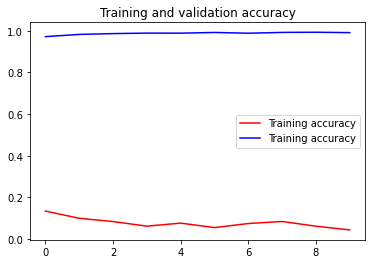

<Figure size 432x288 with 0 Axes>

In [10]:
import matplotlib.pyplot as plt
acc = history.history['acc']
loss = history.history['loss']
epochs = range(len(acc))
plt.plot(epochs, loss, 'r', label='Training accuracy')
plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

#### Step 7:- Testing...............

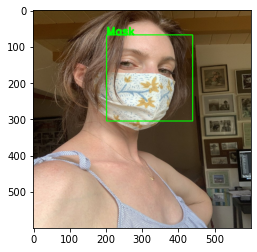

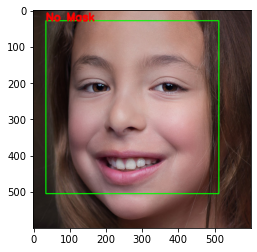

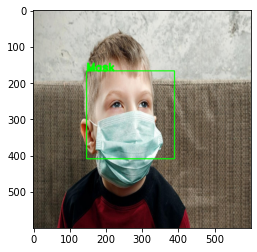

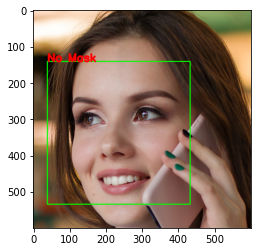

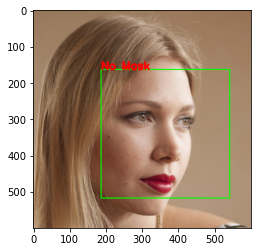

...

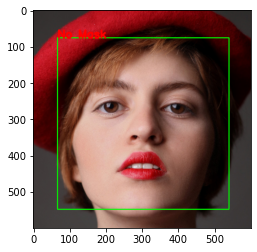

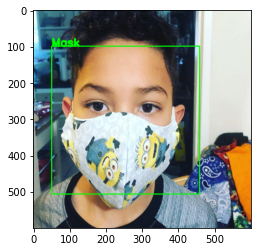

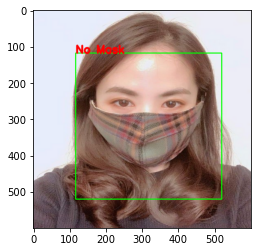

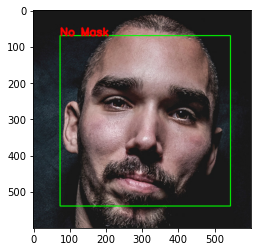

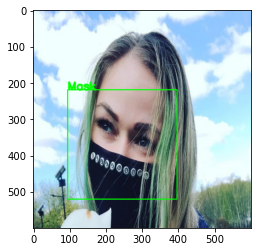

In [11]:
import numpy as np
from tensorflow.keras.preprocessing import image
from matplotlib import pyplot as plt
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for i in range(30):
    img_path = f'{i+1}.jpg'
    img = image.load_img(img_path, target_size=(150, 150, 3))
    x = image.img_to_array(img)/255
    x = np.expand_dims(x, axis=0)
    name = my_model.predict(x)
    
    img = cv2.imread(f'{i+1}.jpg')
    img = cv2.resize(img,(600,600))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray,1.041,6,minSize=(160, 160))
    for (x,y,w,h) in faces:
        img = cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)   
    if name[0][0] < 0.5:
        cv2.putText(img,'Mask',(x,y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 3, cv2.LINE_AA)
    else:
        cv2.putText(img,'No Mask',(x,y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 3, cv2.LINE_AA)
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)   
    plt.imshow(img)
    plt.show()

#### Step 8:- Final Output..................

In [3]:
import io
import base64
from IPython.display import HTML
video = io.open('output.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
<source src="data:video/mp4;base64,{0}" type="video/mp4" /> </video>'''.format(encoded.decode('ascii')))

# Refrence:-
### https://www.tensorflow.org/api_docs/python/tf/keras/applications/InceptionV3
### https://opencv.org/
### https://www.pyimagesearch.com/2020/05/04/covid-19-face-mask-detector-with-opencv-keras-tensorflow-and-deep-learning/